In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd '/content/drive/MyDrive/GenAi Engineer/bài tập python/python/230709 - M02PT01 - Module 2 Final Project - Dr_Dinh_Vinh/dataset'

Mounted at /content/drive
/content/drive/MyDrive/GenAi Engineer/bài tập python/python/230709 - M02PT01 - Module 2 Final Project - Dr_Dinh_Vinh/dataset


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
from google.colab.patches import cv2_imshow
from statistics import mean

#**Project 1: Ứng dụng SVD vào bài toán image compression**


**SVD để nén ảnh grayscale m × n**, đặc biệt là trường hợp **m = 100, n = 1000, k = 1000**:

---

```markdown
# 🎯 SVD Dùng Để Nén Ảnh Grayscale: Trường Hợp m < n

## 🖼️ Giả sử ảnh grayscale có kích thước:

- **A**: 100 × 1000 → Tổng số phần tử: `100 × 1000 = 100,000`

---

## ⚙️ Dùng SVD để nén ảnh

SVD phân rã ma trận A thành 3 thành phần:

```

A ≈ U\_k × Σ\_k × V\_kᵀ

```

- `U_k`: ma trận 100 × k  
- `Σ_k`: vector chứa k giá trị (đường chéo của ma trận Sigma)  
- `V_kᵀ`: ma trận k × 1000  

---

## 📌 Trường hợp chọn **k = 1000** (tức là không nén gì cả):

| Thành phần | Kích thước      | Số phần tử cần lưu |
|------------|-----------------|--------------------|
| `U_k`      | 100 × 1000      | 100,000            |
| `Σ_k`      | 1000 (vector)   | 1,000              |
| `V_kᵀ`     | 1000 × 1000     | 1,000,000          |
| **Tổng**   | —               | **1,101,000** 🤯

🛑 **Lớn gấp hơn 11 lần ảnh gốc!**

---

## ✅ Kết luận

- **SVD chỉ giúp nén dữ liệu khi chọn k < min(m, n)**
- Nếu chọn **k lớn = n hoặc m**, bạn **không nén mà còn làm phình bộ nhớ**
- Cần chọn k phù hợp để cân bằng giữa **chất lượng ảnh** và **kích thước lưu trữ**

---

## 🧠 Gợi ý

- Thông thường chỉ cần **5–20% giá trị đầu tiên trong Σ** (có giá trị lớn) là đủ để giữ lại nội dung chính của ảnh.
- Ví dụ: Với ảnh 100 × 1000, có thể chỉ cần **k = 50 hoặc 100** để giảm kích thước mà chất lượng ảnh vẫn chấp nhận được.

```

---



Cho trước ảnh đầu vào là ảnh màu (hình 1). Hãy phát triển chương trình ứng dụng SVD để
compress ảnh đầu vào sử dụng các giá trị k khác nhau trên ảnh grayscale. Lưu ý rằng k chính
là rank của ma trận ảnh đầu vào sau khi được xám hoá (hay chính xác là tổng số các phần tử
khác không của ma trận Σ, sau khi tính SVD). Bên cạnh đó, bạn cũng cần đánh giá độ sai lệch
của ảnh reconstruction ứng với từng k so với ảnh gốc sử dụng 2 metrics là cosine và root mean
square error. Hình 2 thể hiện kết quả reconstruction sử dụng các giá trị k khác nhau. Hình 3
thể hiện kết quả cosine similarity của ảnh reconstruction và ảnh gốc với các giá trị k khác nhau.
Hình 4 thể hiện kết quả rms error của ảnh reconstruction và ảnh gốc với các giá trị k khác nhau.
Hướng dẫn: để hoàn thành bài tập trên, bạn cần hoàn thiện các function sau đây:

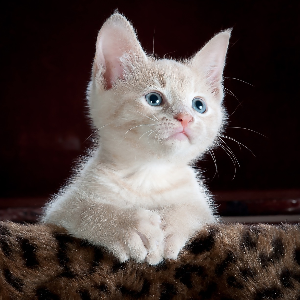

In [ ]:
color_img=cv2.imread('cat.jpeg')
color_img=cv2.resize(color_img,(300,300))
cv2_imshow(color_img)
ratio_for_grayscale=[0.2126, 0.7152, 0.0722]

In [ ]:
def convertColorToGrayScale(image, ratio):
    y, x, c = image.shape
    image = image.astype(float)
    img_gray = np.zeros((y, x), dtype=np.uint8)

    for i in range(y):
        for j in range(x):
            res = 0
            for k in range(c):
                res += image[i, j, k] * ratio[k]
            img_gray[i, j] = np.clip(int(res), 0, 255)  # đảm bảo nằm trong [0, 255]

    return img_gray


In [ ]:
color_image = cv2.imread("cat.jpeg")
color_image = cv2.resize(color_image, (300,300))
ratio_for_grayscale = [0.0722, 0.7152, 0.2126]  # B, G, R
gray_image = convertColorToGrayScale(color_image, ratio_for_grayscale)
print(np.sum(gray_image))

6149203


In [ ]:
np.linalg.matrix_rank(gray_image)

np.int64(300)

In [ ]:
def compute_cosine_similarity(mat1, mat2):
    vec1 = mat1.flatten()
    vec2 = mat2.flatten()

    dot_product = np.dot(vec1, vec2)
    # print('dot : ',dot_product)
    norm1 = np.linalg.norm(vec1)
    norm2 = np.linalg.norm(vec2)

    if norm1 == 0 or norm2 == 0:
        return 0.0  # tránh chia cho 0

    return dot_product / (norm1 * norm2)


In [ ]:
A = np.array([[1,2,2],
[3,2,2],
[-2,1,-3]])
B = np.array([[4,2,4],
[2,-2,5],
[3,4,-4]])

result = compute_cosine_similarity(A,B)
print(np.round(result,2))

dot :  38
0.57


In [ ]:

# def compute_rms_error(matrix1, matrix2):
#     diff = matrix1 - matrix2
#     mse = np.mean(np.square(diff))
#     result = np.sqrt(mse)
#     return result
def compute_rms_error(mat1,mat2):
  res=np.sum((mat1-mat2)**2)
  res/=len(mat1.flatten())
  return math.sqrt(res)

In [ ]:
A = np.array([[1,2,2],
[3,2,2],
[-2,1,-3]])
B = np.array([[4,2,4],
[2,-2,5],
[3,4,-4]])
result = compute_rms_error(A,B)
print(round(result,2))

2.87


In [ ]:
def compute_svd(img):
  U,S,VT=np.linalg.svd(img)
  return U,S,VT

##test re:

In [ ]:
def svd_reconstruct_color(image, k):
    channels = []
    for i in range(3):  # R, G, B
        U, S, VT = np.linalg.svd(image[:, :, i], full_matrices=False)
        Sk = np.diag(S[:k])
        Uk = U[:, :k]
        Vk = VT[:k, :]
        channel_recon = np.dot(np.dot(Uk, Sk), Vk)
        channel_recon = np.clip(channel_recon, 0, 255)
        channels.append(channel_recon.astype(np.uint8))
    return cv2.merge(channels)


Dung lượng bộ nhớ gốc (bytes): 7680000


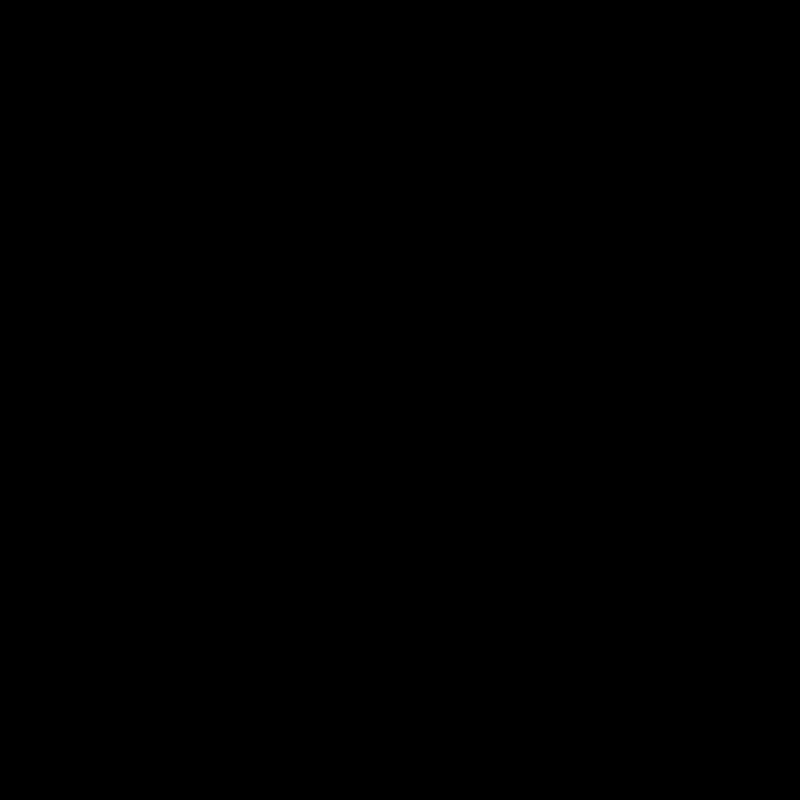

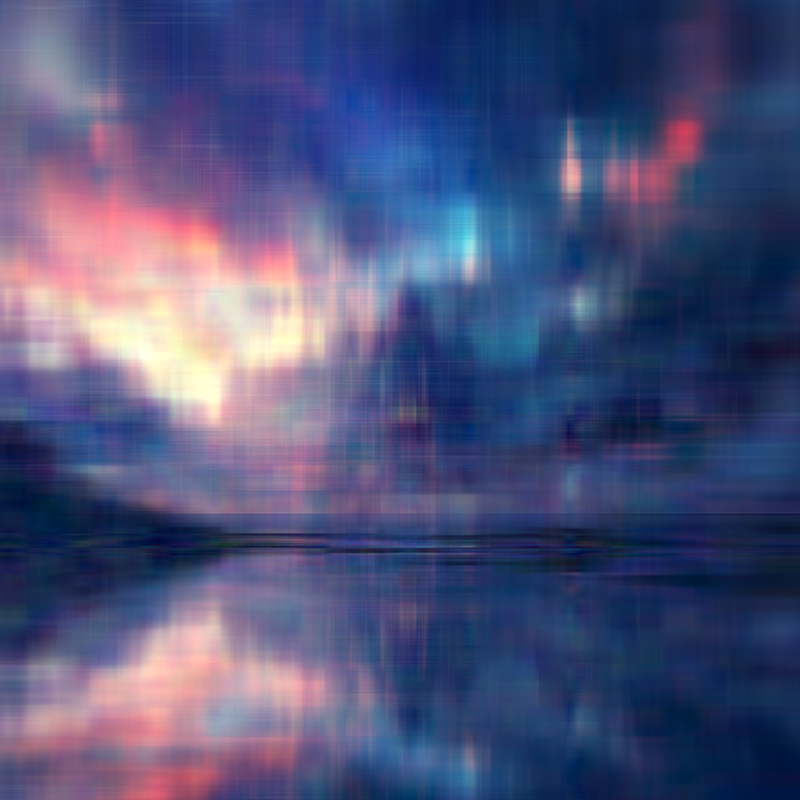

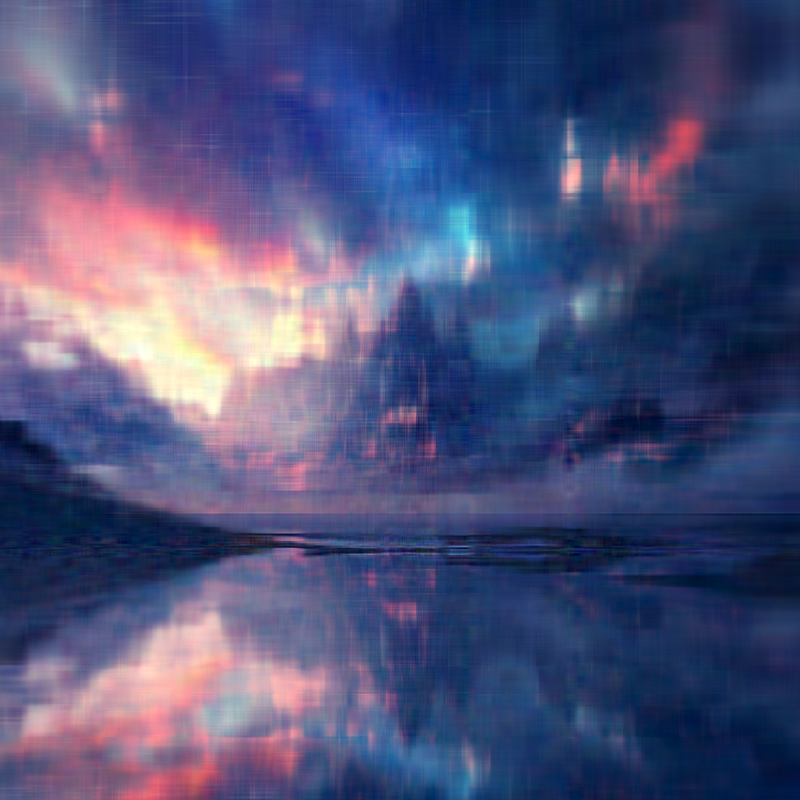

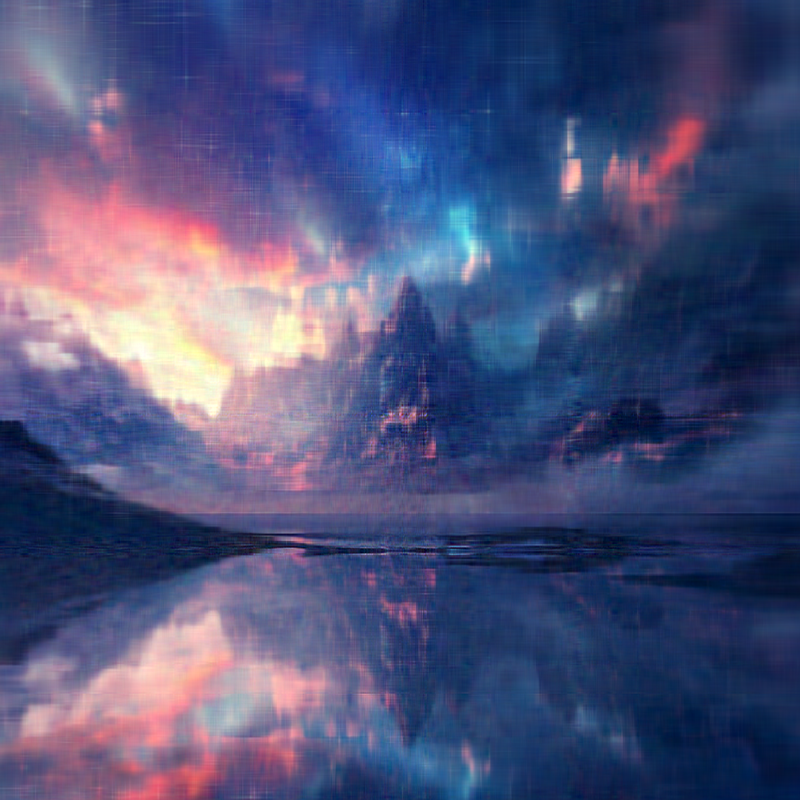

KeyboardInterrupt: 

In [ ]:
image = cv2.imread('pngtree-free-hd-wallpaper-4k-new-background-picture-image_15546678.jpg')
image = cv2.resize(image, (800, 800))
ki=100
print("Dung lượng bộ nhớ gốc (bytes):",image.shape[0]*image.shape[1]*image.shape[2]*4)
for k in range(ki):
  recon = svd_reconstruct_color(image, k=k)

  # print("Kích thước ảnh:", recon.shape)
  # print("Dung lượng bộ nhớ (bytes):", recon.shape[0]*recon.shape[1]*image.shape[2]*4)
  if k%10==0:
    cv2_imshow(recon)


Kích thước ảnh: (800, 800, 3)
Dung lượng bộ nhớ (bytes): 1920000
Dung lượng bộ nhớ (KB): 1875.0
Dung lượng bộ nhớ (MB): 1.8310546875


Kích thước ảnh: (800, 800, 3)
Dung lượng bộ nhớ (bytes): 1920000
Dung lượng bộ nhớ (KB): 1875.0
Dung lượng bộ nhớ (MB): 1.8310546875


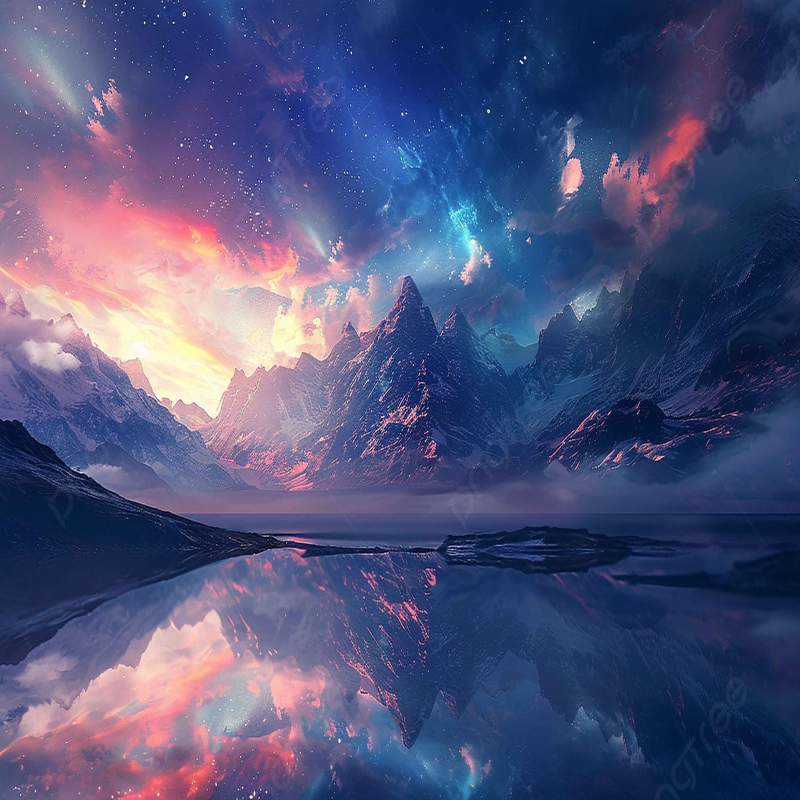

In [ ]:

image = cv2.imread('pngtree-free-hd-wallpaper-4k-new-background-picture-image_15546678.jpg')# ảnh màu, 3 kênh
image = cv2.resize(image, (800, 800))
print("Kích thước ảnh:", image.shape)
print("Dung lượng bộ nhớ (bytes):", image.nbytes)
print("Dung lượng bộ nhớ (KB):", image.nbytes / 1024)
print("Dung lượng bộ nhớ (MB):", image.nbytes / (1024**2))
cv2_imshow(image)

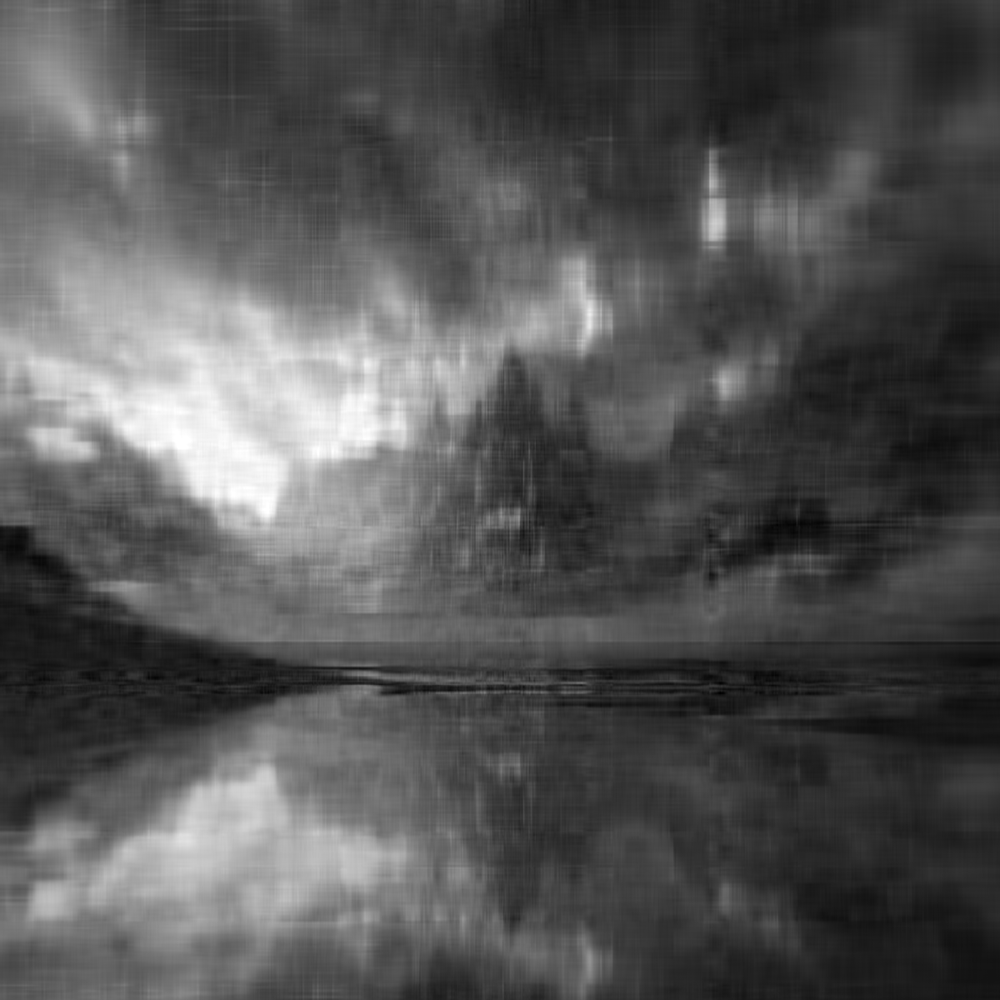

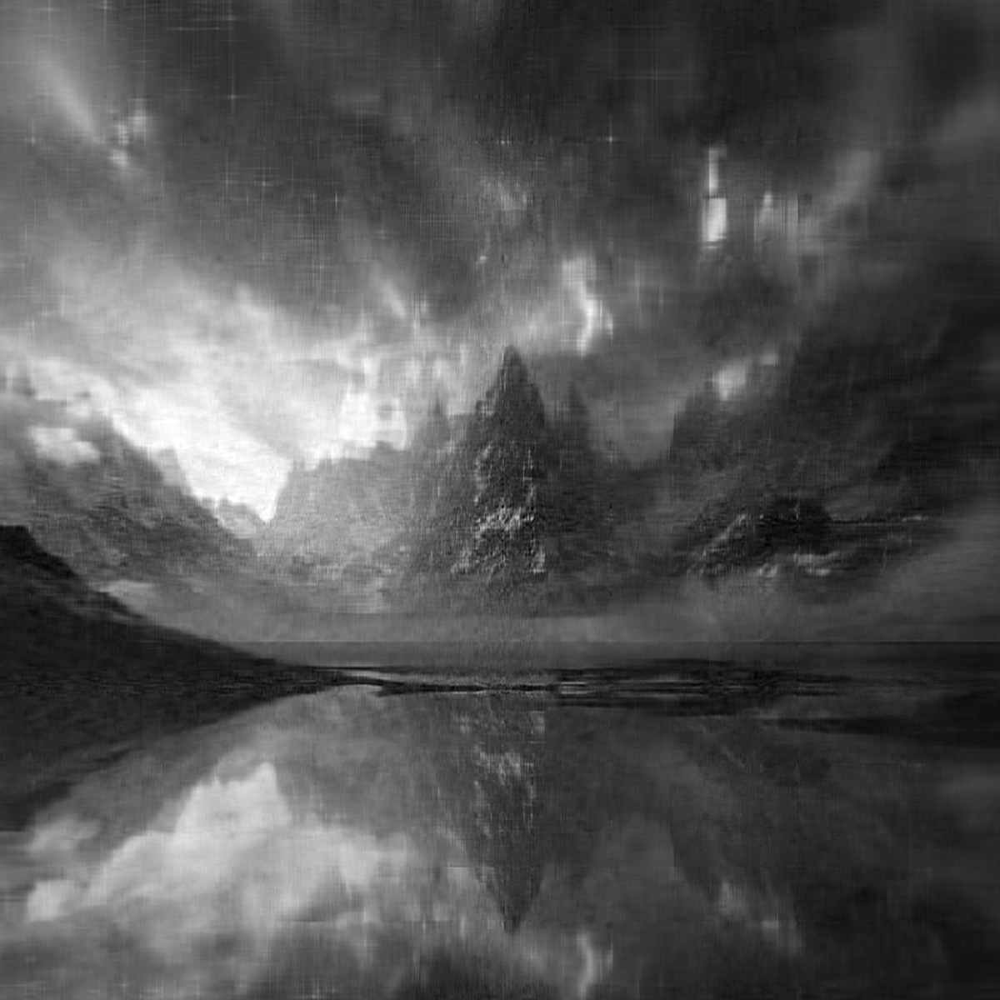

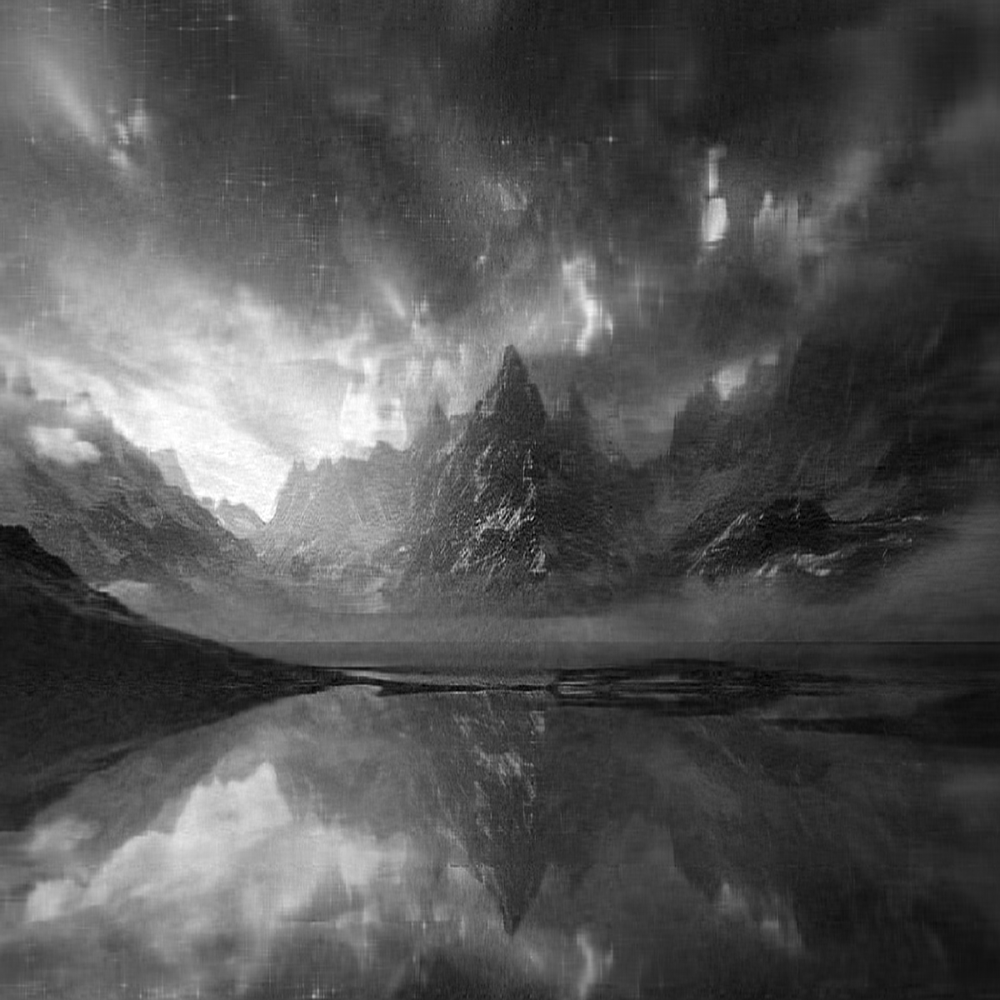

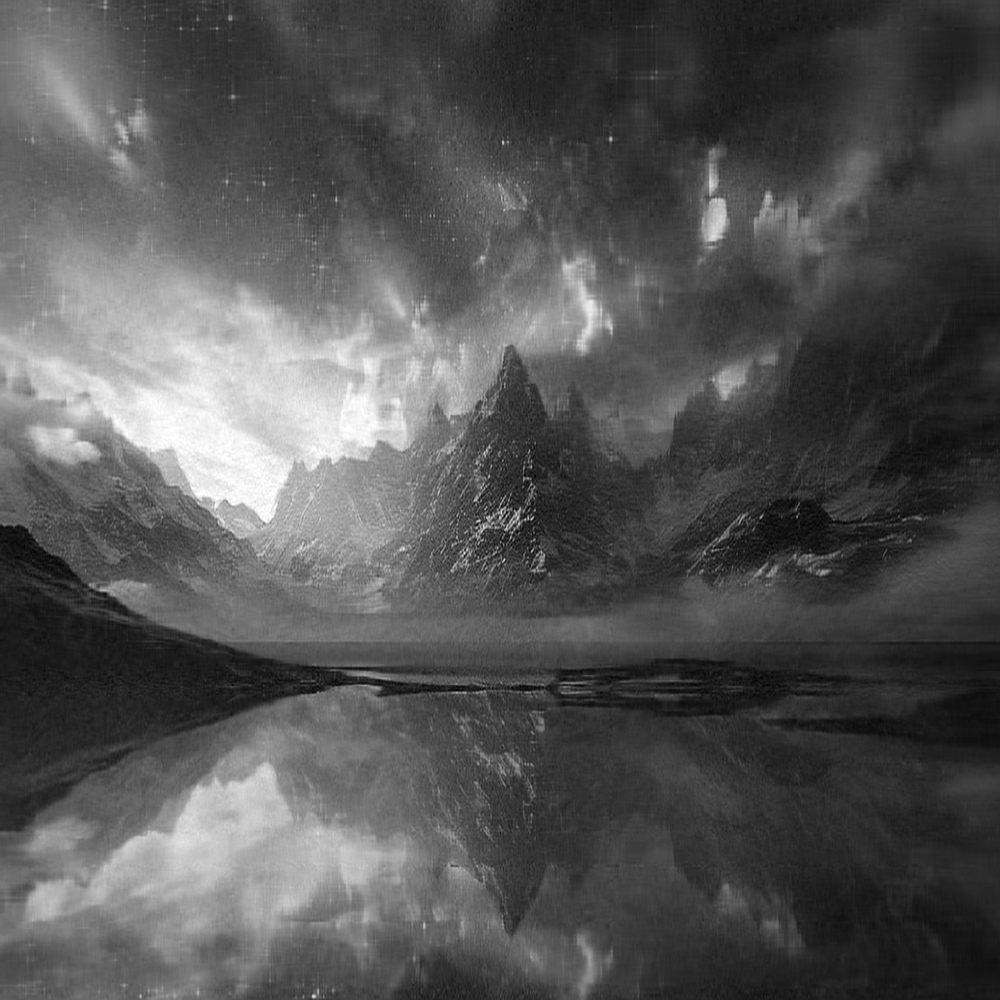

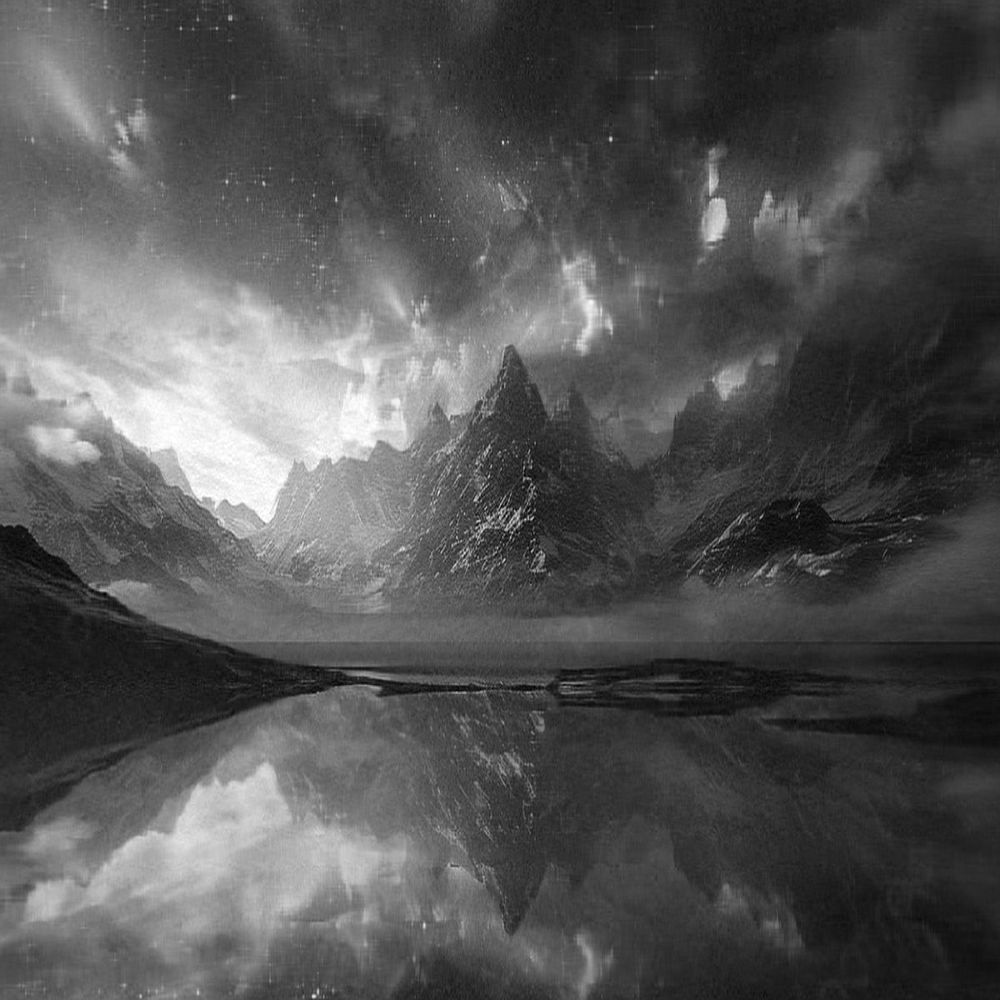

In [ ]:
U, S, VT = compute_svd(gray_image1)
ki = 100
for k in range(1, ki+1):
    Uk = U[:, :k]
    Sk = np.diag(S[:k])
    Vk = VT[:k, :]
    resk = np.dot(np.dot(Uk, Sk), Vk)

    if k % 20 == 0:
        resk_uint8 = np.clip(resk, 0, 255).astype(np.uint8)
        cv2_imshow(cv2.cvtColor(resk_uint8, cv2.COLOR_GRAY2RGB))


In [ ]:
def compress_image_svd(image, k, dtype_size=4):
    """
    Tính toán dung lượng (byte) khi lưu ảnh theo dạng nén SVD với k thành phần chính.
    dtype_size = 4 tương ứng float32 (4 bytes), đổi thành 8 nếu bạn dùng float64.
    """
    h, w, c = image.shape
    total_bytes = 0
    for _ in range(c):  # mỗi kênh màu (R, G, B)
        U = h * k
        S = k  # hoặc k*k nếu bạn muốn lưu ma trận đường chéo
        V = k * w
        total_bytes += (U + S + V) * dtype_size
    return total_bytes

image = cv2.imread('pngtree-free-hd-wallpaper-4k-new-background-picture-image_15546678.jpg')# ảnh màu, 3 kênh
image = cv2.resize(image, (800, 800))

original_size = image.nbytes  # ảnh uint8 (1 byte/pixel/channel)
compressed_size = compress_image_svd(image, k=300)

print("Dung lượng ảnh gốc (MB):", original_size / (1024**2))
print("Dung lượng ảnh sau nén SVD (k=50) (MB):", compressed_size / (1024**2))
print("Tỉ lệ nén:", compressed_size / original_size)



Dung lượng ảnh gốc (MB): 1.8310546875
Dung lượng ảnh sau nén SVD (k=50) (MB): 5.4965972900390625
Tỉ lệ nén: 3.001875


##next:

In [ ]:
def evaluate_svd_for_feature_compression_by_metric(gray_image, metric):
  U,S,V_T = compute_svd(gray_image)
  k = len(S)
  S = np.diag(S)

  approx_list = []
  u_list = []
  metric_list = []

  for i in range(1,k+1,1):
    approx = U[:,:i]@S[0:i,:i]@V_T[:i,:]
    approx_list.append(approx)
    if metric == 0:
      metric_list.append(compute_cosine_similarity(gray_image, approx))
    else:
      metric_list.append(compute_rms_error(gray_image, approx))

  return metric_list, approx_list, k


def draw_metric_information(metric_list, k):
  x_axis = list(range(1,k+1,1))
  plt.xlabel("k")
  plt.ylabel("RMS error")
  plt.plot(x_axis,metric_list, color="r")
  plt.show()

def draw_approx_image(approx_list, k):
  row = 6
  col = 4
  fig = plt.figure(figsize=(25, 25))

  fig_index = 1

  for i in range(0, k, 13):
      # Adds a subplot at the 1st position
      fig.add_subplot(row, col, fig_index)
      # showing image
      plt.imshow(approx_list[i], cmap="gray")

      plt.axis('off')
      plt.title("k =" + str(i+1))
      fig_index = fig_index + 1

  plt.show()



300


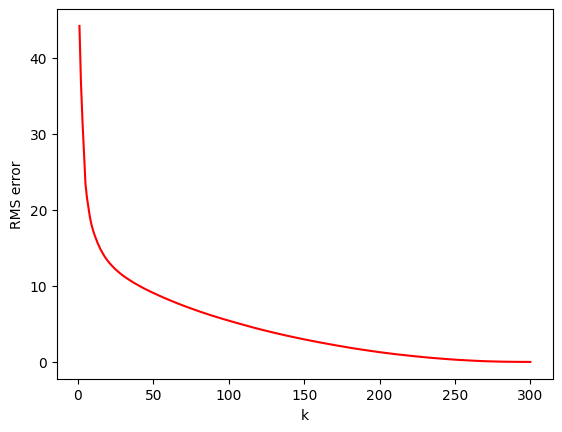

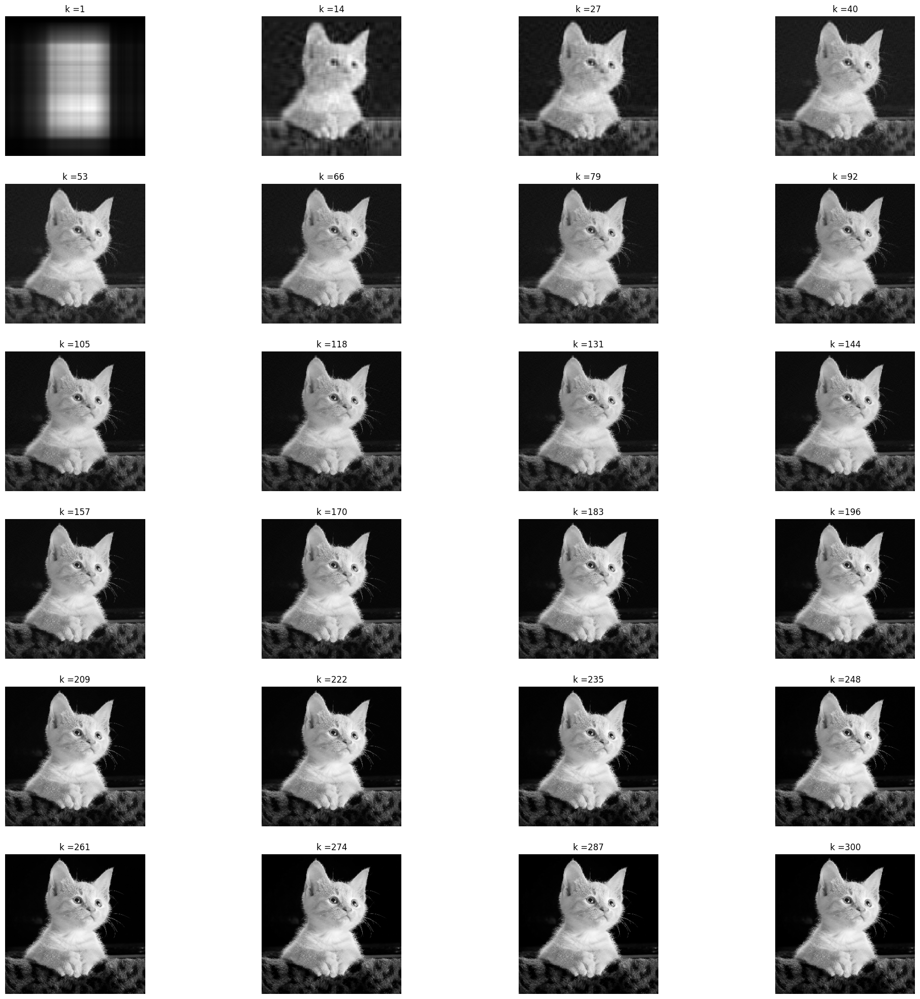

In [ ]:
def main_application():
  color_image=cv2.imread('cat.jpeg')
  color_image=cv2.resize(color_image,(300,300))
  ratio_for_grayscale=[0.2126, 0.7152, 0.0722]
  gray_image=convertColorToGrayScale(color_image,ratio_for_grayscale)
  metric_list,approx_list,k=evaluate_svd_for_feature_compression_by_metric(gray_image,1)
  print(len(approx_list))
  draw_metric_information(metric_list,k)
  draw_approx_image(approx_list,k)

main_application()

In [ ]:
#question 5:
color_image = cv2.imread("cat.jpeg")
color_image = cv2.resize(color_image, (300,300))
ratio_for_grayscale = [0.2126, 0.7152, 0.0722]
gray_image = convertColorToGrayScale(color_image, ratio_for_grayscale)
_, _, k = evaluate_svd_for_feature_compression_by_metric(gray_image,0)
print(k)

300


In [ ]:
# question 6:
truth_storage=960*1440*4
print(truth_storage)
k=100
Uk=960*100*4
Sk=100*4
VTk=100*1440*4
approx_truth=Uk+Sk+VTk
print(approx_truth)
print('tiet kiem duoc : ',np.round(100-(approx_truth*100/truth_storage),2),'%')

5529600
960400
tiet kiem duoc :  82.63 %


#**Project 2: Ứng dụng SVD vào bài toán image denoising**

Ở project này các bạn sẽ được
tìm hiểu cách ứng dụng SVD vào giải quyết bài toán image denosing. Cho trước ảnh đầu vào có
kích thước (2392, 2500), hãy phát triển chương trình sử dụng SVD để giải quyết bài toán image
denosing (giảm nhiễu trên ảnh đầu vào). Hình 5 thể hiện các bước chính giải thuật mà các bạn
cần hiện thực để giải quyết bài toán image denoising.
Hướng dẫn: để hoàn thành bài tập trên, bạn cần hoàn thiện các function sau đây:

In [ ]:
def addNoiseToImage(img,mean=0,stddev=25):
  noise=np.load('noise.npy')
  #add noise to image
  noisy_img=cv2.add(img,noise)
  return noisy_img

In [ ]:
def convertColorToGrayScale(img,ratio):
  res=img@ratio
  return np.round(res).astype(np.uint8)

In [ ]:
color_image=cv2.imread('cat.jpeg')
color_image=cv2.resize(color_image,(300,300))
ratio_for_grayscale=[0.2126,0.7152,0.0722]
gray_image=convertColorToGrayScale(color_image,ratio_for_grayscale)

noise_image=addNoiseToImage(gray_image)
avg_org=np.sum(gray_image)/(gray_image.shape[0]*gray_image.shape[1])
avg_noise=np.sum(noise_image)/(gray_image.shape[0]*gray_image.shape[1])

print('average origin : ',round(avg_org,2))
print('average noise  : ',round(avg_noise,2))

average origin :  66.84
average noise  :  76.73


In [ ]:
def perform_image_denoise(noise_image, sigma_threshold):
    # Tính U, S, V^T
    U, S, VT = np.linalg.svd(noise_image)

    # Giữ lại các giá trị sigma >= ngưỡng
    s_cleaned = np.array([s if s >= sigma_threshold else 0 for s in S])

    # Chuyển thành ma trận đường chéo
    S_cleaned_mat = np.diag(s_cleaned)

    # Tái tạo ảnh (cần cắt đúng kích thước ma trận)
    img_denoised = U @ S_cleaned_mat @ VT

    return img_denoised


In [ ]:
def compute_cosine_similarity(mat1, mat2):
    vec1 = mat1.flatten()
    vec2 = mat2.flatten()

    dot_product = np.dot(vec1, vec2)
    # print('dot : ',dot_product)
    norm1 = np.linalg.norm(vec1)
    norm2 = np.linalg.norm(vec2)

    if norm1 == 0 or norm2 == 0:
        return 0.0  # tránh chia cho 0

    return dot_product / (norm1 * norm2)


In [ ]:
def compute_rms_error(approx_img,img):
  return math.sqrt(np.sum(np.square(approx_img-img))/(approx_img.shape[0]*img.shape[1]))

In [ ]:
def main_application():

  color_image=cv2.imread('cat.jpeg')
  color_image=cv2.resize(color_image,(300,300))

  ratio_for_grayscale=[0.2126, 0.7152, 0.0722]
  gray_image=convertColorToGrayScale(color_image,ratio_for_grayscale)

  cv2.imwrite('gray_cat.jpeg',gray_image)

  #Add Gaussian noise to gray image
  noise_gray_image=addNoiseToImage(gray_image,0,25)

  #Save noisy grayscale iamge to file noise_gray_image.jpeg
  cv2.imwrite('noise_gray_cat.jpeg',noise_gray_image)

  #Perform image denoise
  sigma_threshold=200
  denoise_image=perform_image_denoise(noise_gray_image,sigma_threshold)

  cv2.imwrite('denoise_cat.jpeg',denoise_image)

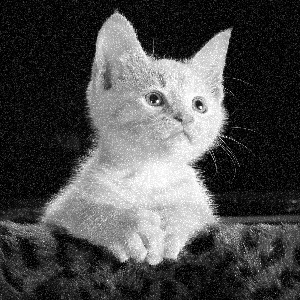

rms :  17.28


In [ ]:
color_image=cv2.imread('cat.jpeg')
color_image=cv2.resize(color_image,(300,300))
ratio_for_grayscale=[0.2126,0.7152,0.0722]
gray_image=convertColorToGrayScale(color_image,ratio_for_grayscale)
noise_gray_image=addNoiseToImage(gray_image,0,25)

sigma_threshold=200
denoise_image=perform_image_denoise(noise_gray_image,sigma_threshold)
cv2_imshow(denoise_image)
similarity=compute_rms_error(denoise_image,gray_image)
print("rms : ",round(similarity,2))

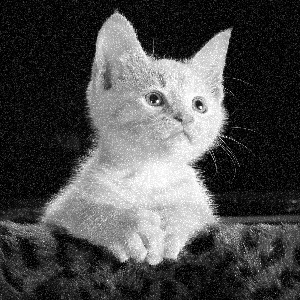

similarity 0.9896


In [ ]:
#Read an color image
color_image = cv2.imread("cat.jpeg")
color_image = cv2.resize(color_image, (300,300))
ratio_for_grayscale = [0.2126, 0.7152, 0.0722]
gray_image = convertColorToGrayScale(color_image, ratio_for_grayscale)
noise_gray_image = addNoiseToImage(gray_image, 0, 25)
#Perform image denoise
sigma_threshold = 200
denoise_image = perform_image_denoise(noise_gray_image, sigma_threshold)
cv2_imshow(denoise_image)
similarity = compute_cosine_similarity(denoise_image,gray_image)
print("similarity", round(similarity,4))

In [ ]:
import numpy as np

def find_best_sigma_image_denoise(noise_image, original_image, metric=0, sigma_range=1000):
    # Dùng SVD để phân rã ảnh bị nhiễu
    U, S, VH = np.linalg.svd(noise_image, full_matrices=False)

    evaluation_history = []

    for sigma_threshold in range(1, sigma_range):
        # Làm sạch S bằng ngưỡng sigma
        S_cleaned = np.array([s if s > sigma_threshold else 0 for s in S])

        # Tái tạo lại ảnh từ SVD đã làm sạch
        S_mat = np.diag(S_cleaned)
        img_denoised = np.dot(U, np.dot(S_mat, VH))

        # Chọn metric đánh giá
        if metric == 0:
            similarity = compute_cosine_similarity(original_image, img_denoised)
            evaluation_history.append(similarity)
        else:
            error = compute_rms_error(original_image, img_denoised)
            evaluation_history.append(error)

    # Chọn chỉ số tốt nhất
    if metric == 0:
        best_index = evaluation_history.index(max(evaluation_history))  # cosine similarity càng cao càng tốt
    else:
        best_index = evaluation_history.index(min(evaluation_history))  # RMS error càng thấp càng tốt

    return best_index, evaluation_history

In [ ]:
def find_best_sigma_based_cosine():
  #Read an colori mage
  color_image = cv2.imread("cat.jpeg")
  #Resize an image to (300,300)
  color_image = cv2.resize(color_image, (300,300))
  #Convert image to grayscale
  ratio_for_grayscale = [0.2126, 0.7152, 0.0722]
  gray_image = convertColorToGrayScale(color_image, ratio_for_grayscale)
  #Save resized grayscale image to file gray_image.png
  cv2.imwrite("gray_image.png", gray_image)
  # Add Gaussian noise to gray image
  noise_gray_image = addNoiseToImage(gray_image, 0, 25)
  #Save noisy grayscale image to file noise_gray_image.png
  cv2.imwrite("noise_gray_image.png", noise_gray_image)
  metric = 0 # for cosine similarity
  best_threshold, evaluation_history = find_best_sigma_image_denoise(noise_gray_image,gray_image, metric)
  print("best sigma: ", best_threshold)
find_best_sigma_based_cosine()

best sigma:  503


In [ ]:
def find_best_sigma_based_cosine():
  #Read an colori mage
  color_image = cv2.imread("cat.jpeg")
  #Resize an image to (300,300)
  color_image = cv2.resize(color_image, (300,300))
  #Convert image to grayscale
  ratio_for_grayscale = [0.2126, 0.7152, 0.0722]
  gray_image = convertColorToGrayScale(color_image, ratio_for_grayscale)
  #Save resized grayscale image to file gray_image.png
  cv2.imwrite("gray_image.png", gray_image)
  # Add Gaussian noise to gray image
  noise_gray_image = addNoiseToImage(gray_image, 0, 25)
  #Save noisy grayscale image to file noise_gray_image.png
  cv2.imwrite("noise_gray_image.png", noise_gray_image)
  metric = 1 # for RMSE
  best_threshold, evaluation_history = find_best_sigma_image_denoise(noise_gray_image,gray_image, metric)
  print("best sigma: ", best_threshold)
find_best_sigma_based_cosine()

best sigma:  546


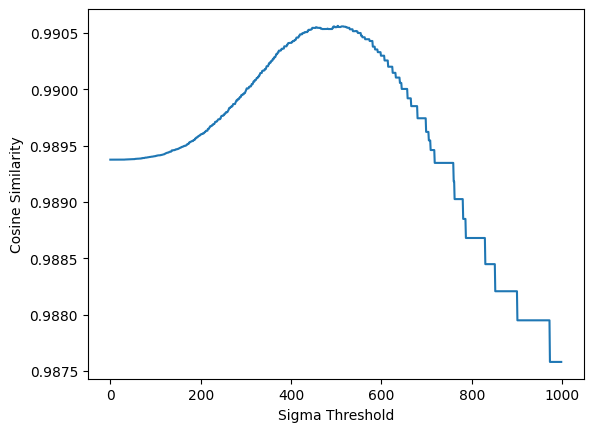

In [ ]:
def plot_chart_based_cosine():
  #Read an colori mage
  color_image = cv2.imread("cat.jpeg")
  #Resize an image to (300,300)
  color_image = cv2.resize(color_image, (300,300))
  #Convert image to grayscale
  ratio_for_grayscale = [0.2126, 0.7152, 0.0722]
  gray_image = convertColorToGrayScale(color_image, ratio_for_grayscale)
  #Save resized grayscale image to file gray_image.png
  cv2.imwrite("gray_image.png", gray_image)
  # Add Gaussian noise to gray image
  noise_gray_image = addNoiseToImage(gray_image, 0, 25)
  #Save noisy grayscale image to file noise_gray_image.png
  cv2.imwrite("noise_gray_image.png", noise_gray_image)
  metric = 0 # for cosine similarity
  best_threshold, evaluation_history = find_best_sigma_image_denoise(noise_gray_image,gray_image, metric)
  plt.plot(evaluation_history)
  plt.xlabel("Sigma Threshold")
  plt.ylabel("Cosine Similarity")
  plt.show()
plot_chart_based_cosine()

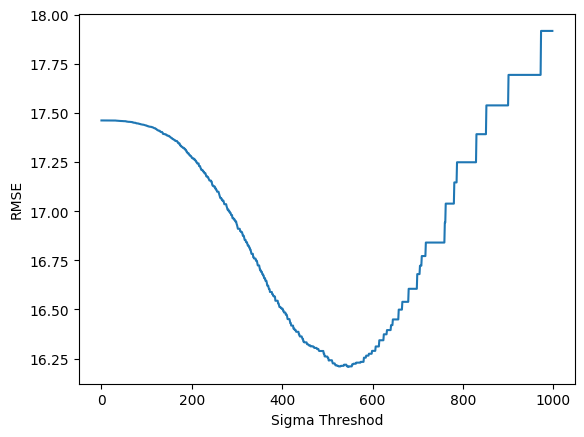

In [ ]:
def plot_chart_based_rmse():
  #Read an colori mage
  color_image = cv2.imread("cat.jpeg")
  #Resize an image to (300,300)
  color_image = cv2.resize(color_image, (300,300))
  #Convert image to grayscale
  ratio_for_grayscale = [0.2126, 0.7152, 0.0722]
  gray_image = convertColorToGrayScale(color_image, ratio_for_grayscale)
  #Save resized grayscale image to file gray_image.png
  cv2.imwrite("gray_image.png", gray_image)
  # Add Gaussian noise to gray image
  noise_gray_image = addNoiseToImage(gray_image, 0, 25)
  #Save noisy grayscale image to file noise_gray_image.png
  cv2.imwrite("noise_gray_image.png", noise_gray_image)
  metric = 1 # for cosine similarity
  best_threshold, evaluation_history = find_best_sigma_image_denoise(noise_gray_image,
  gray_image, metric)
  plt.plot(evaluation_history)
  plt.xlabel("Sigma Threshod")
  plt.ylabel("RMSE")
  plt.show()
plot_chart_based_rmse()

#some thinkings

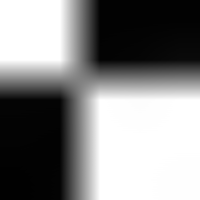

In [ ]:
A = np.array([
    [255, 255,   2,   2,   2],
    [255, 255,   3,   5,  10],
    [  4,   4, 255, 253, 255],
    [  3,   2, 255, 255, 255],
    [  1,   3, 255, 255, 254]
], dtype=np.uint8)
As=cv2.resize(A,(200,200))
cv2_imshow(As)

Tại sao giá trị trong U có thể âm dù là "hình chiếu"?

## 🔹 SVD là gì?
Một ma trận A được phân rã thành:
A = U Σ Vᵀ

- U: ma trận chứa các vector đơn vị theo hướng chiếu
- Σ: ma trận đường chéo chứa các giá trị độ lớn (singular values)
- Vᵀ: ma trận xoay trục toạ độ

## 🔹 Tại sao cần chuẩn hoá?
- Vì ta muốn tách **hướng (U)** và **độ lớn (Σ)** riêng rẽ
- Mỗi cột trong A là: U[:,i] * σ_i * (tổ hợp tuyến tính từ V)

## 🔹 Vì sao U có thể âm?
- U chứa **toạ độ chiếu** (có thể âm nếu ngược hướng)
- Không phải là "độ dài hình chiếu", mà là **hệ số chiếu**
- Vì vậy, giá trị trong U có thể âm mà vẫn đúng toán học

## ✅ Tổng kết
Dù hình ảnh giải thích là "chiếu", bản chất là ta đang biểu diễn trong hệ cơ sở trực giao nên hệ số có thể âm. Chuẩn hoá giúp ta chia tách rõ ràng giữa hướng (U, V) và độ lớn (Σ).


In [ ]:
U,Sig,VT=np.linalg.svd(A)
Sig=np.diag(Sig)
print(np.round(U,2))


[[-0.02  0.71  0.68 -0.19  0.03]
 [-0.03  0.71 -0.68  0.2  -0.03]
 [-0.58 -0.02 -0.16 -0.48  0.64]
 [-0.58 -0.02 -0.05 -0.3  -0.76]
 [-0.58 -0.02  0.22  0.78  0.12]]


In [ ]:
print(np.round(Sig,2))

[[764.29   0.     0.     0.     0.  ]
 [  0.   509.74   0.     0.     0.  ]
 [  0.     0.     3.73   0.     0.  ]
 [  0.     0.     0.     1.62   0.  ]
 [  0.     0.     0.     0.     1.21]]


In [ ]:
print(np.round(VT,2))

[[-0.02 -0.02 -0.58 -0.58 -0.58]
 [ 0.71  0.71 -0.02 -0.02 -0.01]
 [-0.06  0.07  0.54  0.26 -0.8 ]
 [-0.57  0.57 -0.4   0.44 -0.03]
 [-0.41  0.41  0.47 -0.64  0.17]]


Tôi sẽ giải thích chi tiết hơn về cách các đặc trưng (features) và giá trị sigma tương ứng với những phần cụ thể trong ảnh.

Trong hình ảnh 5×5 được hiển thị:

## Đặc trưng "Black to White" và sigma σ₁ = 764.29

Đặc trưng "Black to White" (từ đen sang trắng) là đặc trưng quan trọng nhất trong ảnh với giá trị sigma σ₁ = 764.29. Nó tương ứng với mẫu chuyển tiếp từ vùng đen sang vùng trắng trong ảnh.

Cụ thể, trong ma trận ảnh A, bạn có thể thấy phần tương ứng của đặc trưng này là khu vực nơi có sự thay đổi từ pixel tối (các số nhỏ như 1-10) sang pixel sáng (255):
- Ở hàng thứ 3, có sự chuyển tiếp từ giá trị 4 sang 255
- Ở hàng thứ 4, có sự chuyển tiếp từ giá trị 3, 2 sang 255
- Ở hàng thứ 5, có sự chuyển tiếp từ giá trị 1, 3 sang 255

Trong ma trận U, cột đầu tiên (được đánh dấu bằng khung đỏ bên trái) chứa các giá trị vector riêng tương ứng với đặc trưng này, với các giá trị (-0.57) lặp lại nhiều lần, cho thấy tính nhất quán của đặc trưng này.

## Đặc trưng "White to Black" và sigma σ₂ = 509.74

Đặc trưng "White to Black" (từ trắng sang đen) là đặc trưng quan trọng thứ hai với giá trị sigma σ₂ = 509.74. Nó tương ứng với mẫu chuyển tiếp từ vùng trắng sang vùng đen trong ảnh.

Trong ma trận ảnh A, phần tương ứng của đặc trưng này là:
- Ở hàng đầu tiên, có sự chuyển tiếp từ giá trị 255 sang 2
- Ở hàng thứ hai, có sự chuyển tiếp từ giá trị 255 sang 3, 5, 10

Trong ma trận U, cột thứ hai (được đánh dấu bằng khung đỏ bên phải) chứa các giá trị vector riêng tương ứng với đặc trưng này, với các giá trị 0.70 lặp lại, thể hiện đặc điểm của mẫu này.

## Tóm lại:

- σ₁ = 764.29 tương ứng với đặc trưng "Black to White" - mô tả sự chuyển tiếp từ phần tối (đen) ở góc dưới bên trái sang phần sáng (trắng) ở góc dưới bên phải của ảnh
- σ₂ = 509.74 tương ứng với đặc trưng "White to Black" - mô tả sự chuyển tiếp từ phần sáng (trắng) ở góc trên bên trái sang phần tối (đen) ở góc trên bên phải của ảnh

Các giá trị sigma cao hơn chỉ ra rằng các mẫu tương ứng chiếm phần quan trọng hơn trong việc mô tả thông tin của ảnh. Vì vậy, đặc trưng "Black to White" với σ₁ = 764.29 là mẫu quan trọng nhất trong ảnh này.

[[255. 255.   0.   1.   4.]
 [255. 255.   5.   5.   8.]
 [  4.   4. 255. 254. 254.]
 [  2.   3. 255. 255. 255.]
 [  2.   2. 255. 254. 255.]]


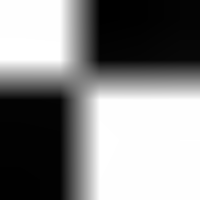

In [ ]:
k=2# ơ1>ơ2>>ơi nên ơ1,2 lưu trữ nhiều thông tin nhất
img=U[:,:k]@Sig[0:k,:k]@VT[:k,:]
print(np.round(img))
Aks=cv2.resize(img,(200,200))
cv2_imshow(Aks)

In [ ]:
Sig[:1,:1]

array([[764.29364506]])

[[  0.   0.   9.   9.   9.]
 [  0.   0.  13.  13.  13.]
 [ 10.  10. 254. 254. 254.]
 [ 10.  10. 255. 254. 255.]
 [ 10.  10. 255. 254. 255.]]


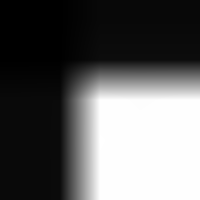

In [ ]:
#lay ơ1 bỏ ơ2 (ta se thay phan chuyen doi den->trang hang ngang duoi con giu)
img=U[:,:1]@Sig[:1,:1]@VT[:1,:]
print(np.round(img))
Aks=cv2.resize(img,(200,200))
cv2_imshow(Aks)

In [ ]:
Sig[1:2,1:2]

array([[509.74330048]])

[[255. 255.  -8.  -7.  -5.]
 [255. 255.  -8.  -7.  -5.]
 [ -6.  -6.   0.   0.   0.]
 [ -7.  -7.   0.   0.   0.]
 [ -8.  -8.   0.   0.   0.]]


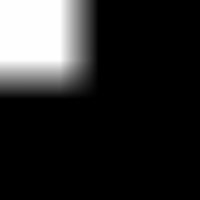

In [ ]:
#lay ơ2 bỏ ơ1 (ta se thay phan chuyen doi tu trang->den hang ngang tren con giu)
img=U[:,1:2]@Sig[1:2,1:2]@VT[1:2,:]
print(np.round(img))
Aks=cv2.resize(img,(200,200))
cv2_imshow(Aks)

[[ 0. -0.  0. -0.  0.]
 [-0.  0. -0.  0. -0.]
 [ 0. -0.  1. -1.  0.]
 [ 1. -1. -0.  0. -0.]
 [-1.  1. -0.  0. -0.]]


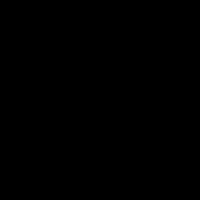

In [ ]:
#lay all bỏ ơ1,2 (ta se thay phan chuyen doi tu trang->den hang ngang tren con giu)
img=U[:,3:]@Sig[3:,3:]@VT[3:,:]
print(np.round(img))
Aks=cv2.resize(img,(200,200))
cv2_imshow(Aks)